# DL Model Fit with Validation
* Test several loss functions and optimizers
* Use several metrics to compare
* Test on last data point
* Visualize loss and metrics
* Evaluate and predict on train set to try to foresee the result

__If any single HP has to be tuned, this should be the learning rate__. Good articles about learning rate:  
a) Theory: https://machinelearningmastery.com/learning-rate-for-deep-learning-neural-networks/  
b) Practice: https://machinelearningmastery.com/using-learning-rate-schedules-deep-learning-models-python-keras/   
FINDING THE RIGHT LEARNING SHOULD A WHOLE SEPARATE EXPERIMENT OF ITS OWN

In [1]:
from copy import deepcopy
import numpy as np
import pandas as pd
from sklearn.utils import shuffle
import time
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense, Bidirectional, LSTM, Dropout, ConvLSTM2D, Flatten, TimeDistributed, RepeatVector
from keras.layers.convolutional import Conv1D, MaxPooling1D
from keras.utils.generic_utils import get_custom_objects
from keras import backend as K
from keras.layers import Activation
from keras.optimizers import SGD, RMSprop, Adagrad, Adadelta, Adamax, Adam, Nadam, Ftrl
from keras.callbacks import LearningRateScheduler
from helper import ( prepare_data, train_test_shuffle_split, train_test_seq_split, print_folds_stats )
#from sklearn.preprocessing import StandardScaler
#from sklearn.metrics import mean_squared_error as mse

from matplotlib import pyplot as plt
plt.style.use('ggplot')     # 'fivethirtyeight'
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [2]:
# LOSSES
mse   = tf.keras.losses.MeanSquaredError()
mae   = tf.keras.losses.MeanAbsoluteError()
mape  = tf.keras.losses.MeanAbsolutePercentageError()
msle  = tf.keras.losses.MeanSquaredLogarithmicError()        # square(log(y_true + 1.) - log(y_pred + 1.))
huber = tf.keras.losses.Huber()
logcosh = tf.keras.losses.LogCosh()

# METRICS
metric_mse   = tf.keras.metrics.MeanSquaredError()
metric_rmse  = tf.keras.metrics.RootMeanSquaredError()
metric_mae   = tf.keras.metrics.MeanAbsoluteError()
metric_mape  = tf.keras.metrics.MeanAbsolutePercentageError()
metric_msle  = tf.keras.metrics.MeanSquaredLogarithmicError()
metric_lcosh = tf.keras.metrics.LogCoshError()

In [3]:
# PREDICT ON ONE DATA POINT
def predict_one(model, X_last, loss_func=mse):
       
    X_last = X_last.reshape((1, n_steps, n_features))
    pred = model.predict(X_last, verbose=0)
    return np.round( pred[0] )

## Prepare data

In [4]:
df = pd.read_csv( 'data/2step_20210329.csv', encoding='utf-8' )
print('Shape of loaded data:', df.shape, '\n')

random_state      = 34
n_steps           = 4
features          = ['num1', 'num2', 'num3', 'num4']
n_features        = len(features)
with_intersection = True
flatten           = False

( X,
  y,
  goldenx,
  goldeny )  = prepare_data( df,
                             features,
                             n_steps,
                             with_intersection=with_intersection,
                             flatten=flatten )

X_sh, y_sh = deepcopy(X), deepcopy(y)
X_sh, y_sh = shuffle( X_sh, y_sh, random_state=random_state, n_samples=None )

Shape of loaded data: (2073, 8) 

Dropping 1 last row for golden data point
Data prepared:
	Size of X = (2068 by 4)
	Size of y = (2068 by 4)


## Create model

In [5]:
def stacked_BiLSTM( n_steps, n_features,
                    learning_rate=0.001,
                    units=750,
                    activation='relu',
                    dropout1=0,
                    dropout2=0,
                    dropout3=0,
                    optimizer=Adam,
                    loss=mse,
                    use_lr_decay=False,
                    metrics=[metric_mse],
                    print_architecture=False ):
    
    model = Sequential()
    model.add( Bidirectional( LSTM( units, activation=activation,
                                    dropout=dropout1,
                                    recurrent_dropout=dropout2,
                                    return_sequences=True),
                                                          
                              input_shape=(n_steps, n_features)
                            )
             )
        
    model.add( Bidirectional( LSTM( units, activation=activation ) ) )
    model.add(Dropout( dropout3 ))
    model.add( Dense( n_features ) )
    
    # DO I NEED THIS?
    if use_lr_decay:
        learning_rate = 0.0
    
    model.compile( optimizer=optimizer(lr=learning_rate),
                   loss=loss,
                   metrics=metrics )     # metrics=['mse'], optimizer=Adam(lr=learning_rate)
        
    if print_architecture:
        print(model.summary())
        
    return model

In [6]:
# PRINT AS AN EXAMPLE
model = stacked_BiLSTM( n_steps, n_features, print_architecture=True )

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
bidirectional (Bidirectional (None, 4, 1500)           4530000   
_________________________________________________________________
bidirectional_1 (Bidirection (None, 1500)              13506000  
_________________________________________________________________
dropout (Dropout)            (None, 1500)              0         
_________________________________________________________________
dense (Dense)                (None, 4)                 6004      
Total params: 18,042,004
Trainable params: 18,042,004
Non-trainable params: 0
_________________________________________________________________
None


## Fit model & plot results

In [7]:
# LEARNING RATE DECAY
import math
def step_decay(epoch):
    
    initial_lrate = 0.005
    drop = 0.5
    epochs_drop = 10.0
    lrate = initial_lrate * math.pow(drop, math.floor((1+epoch)/epochs_drop))
        
    return lrate

#for i in range(50):
#    print( step_decay(i) )

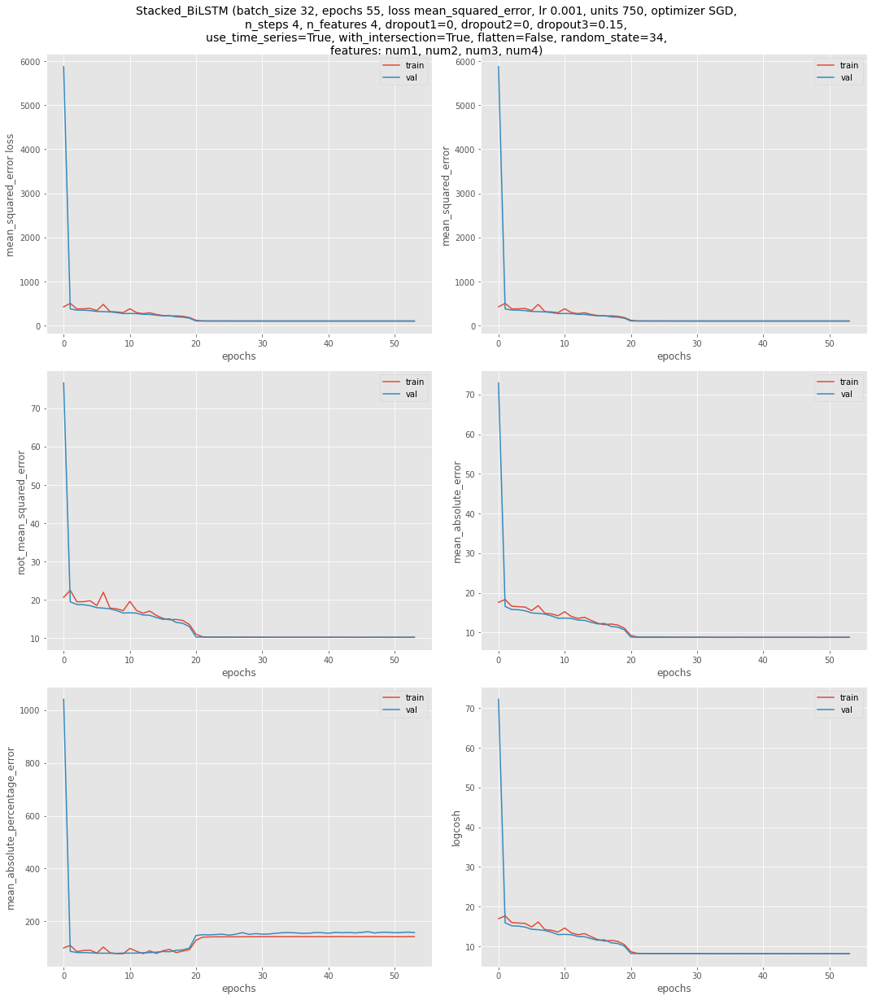

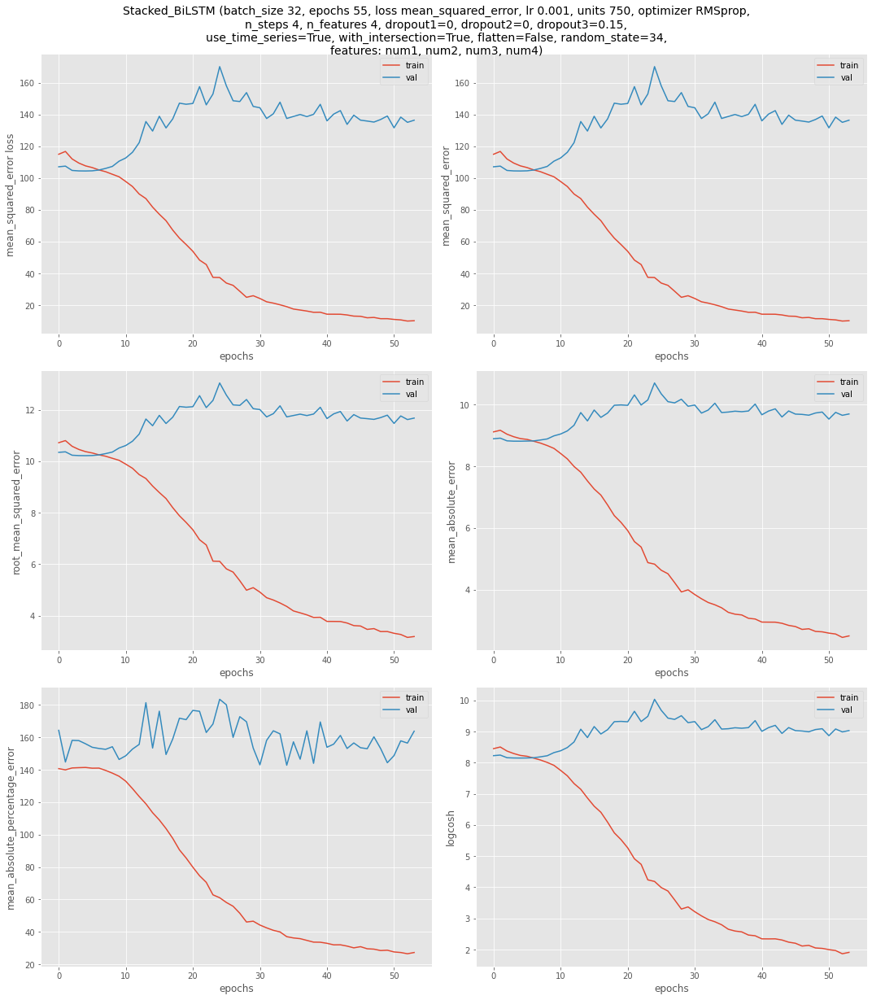

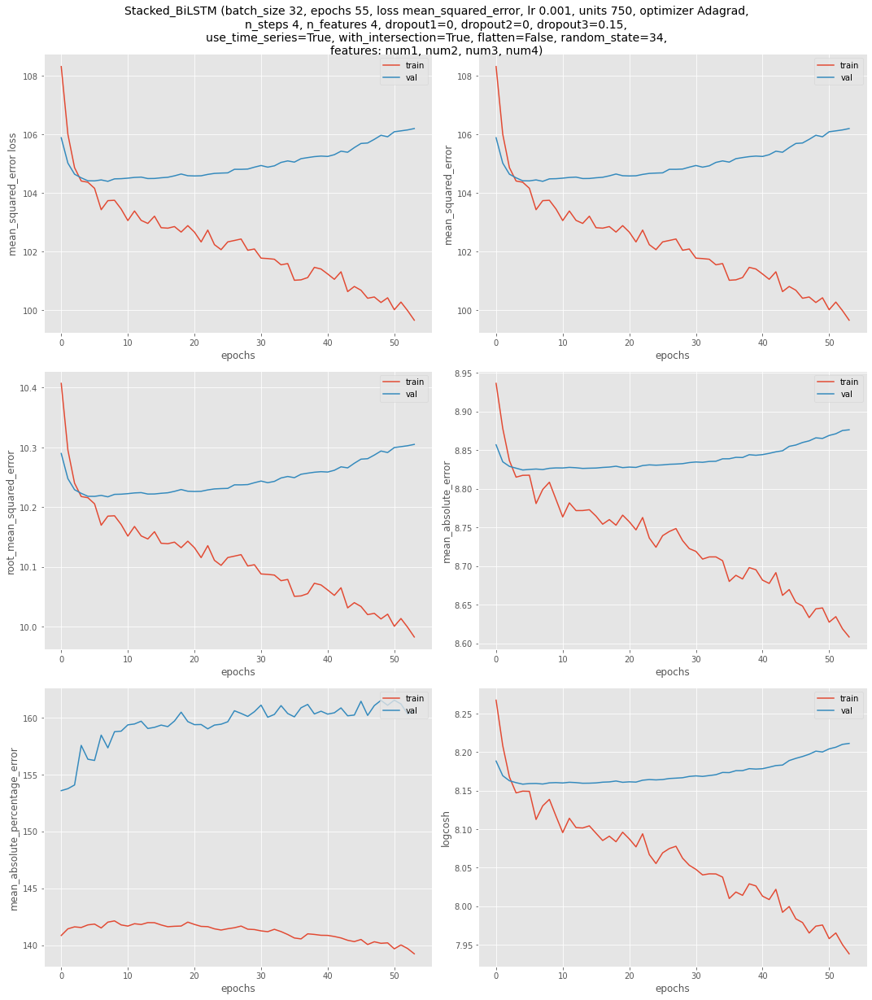

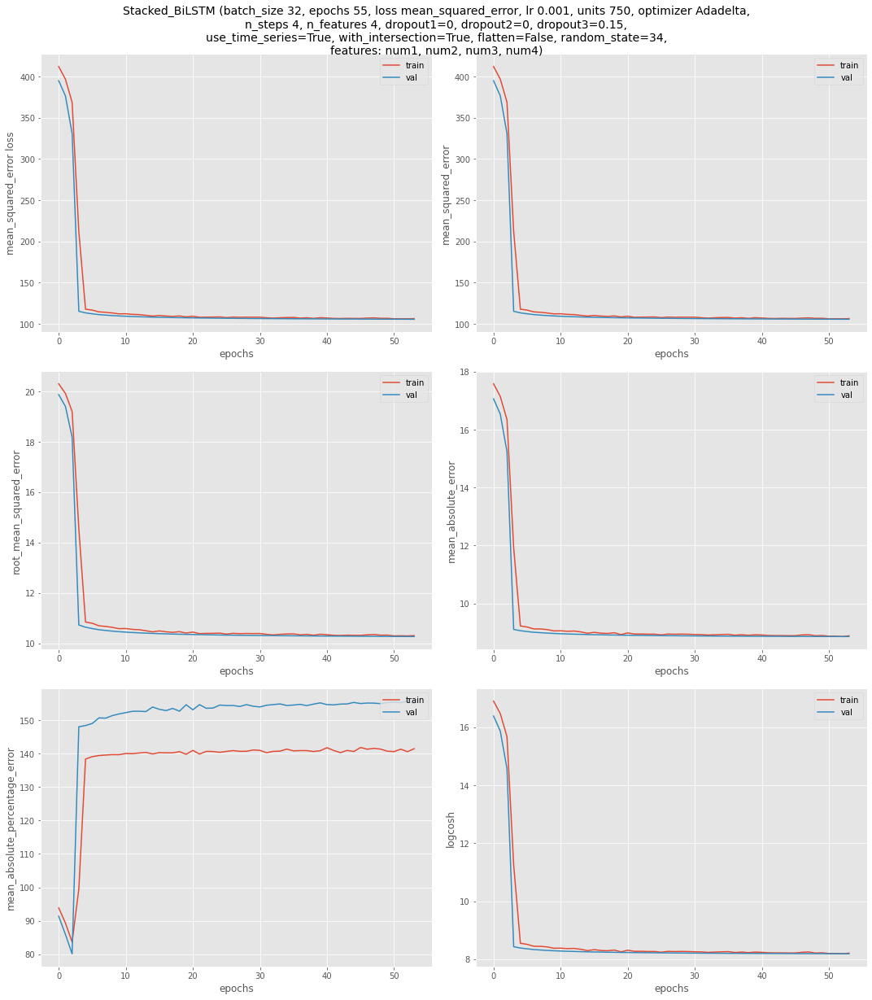

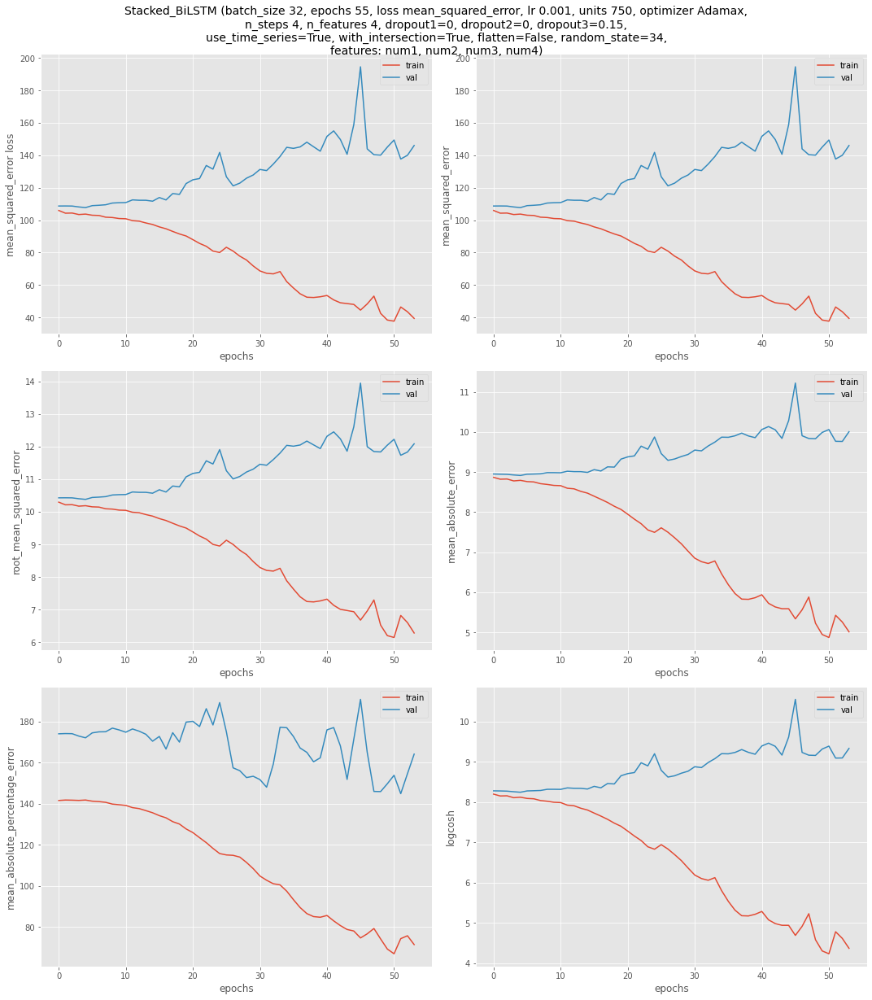

...

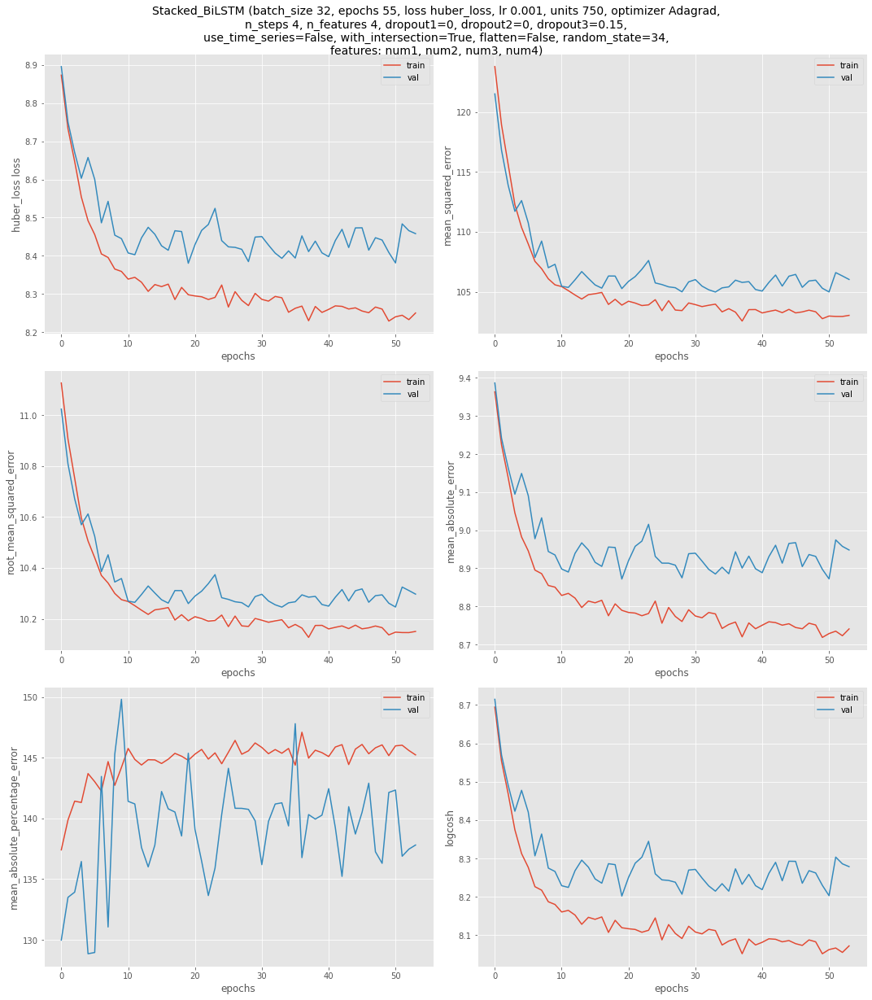

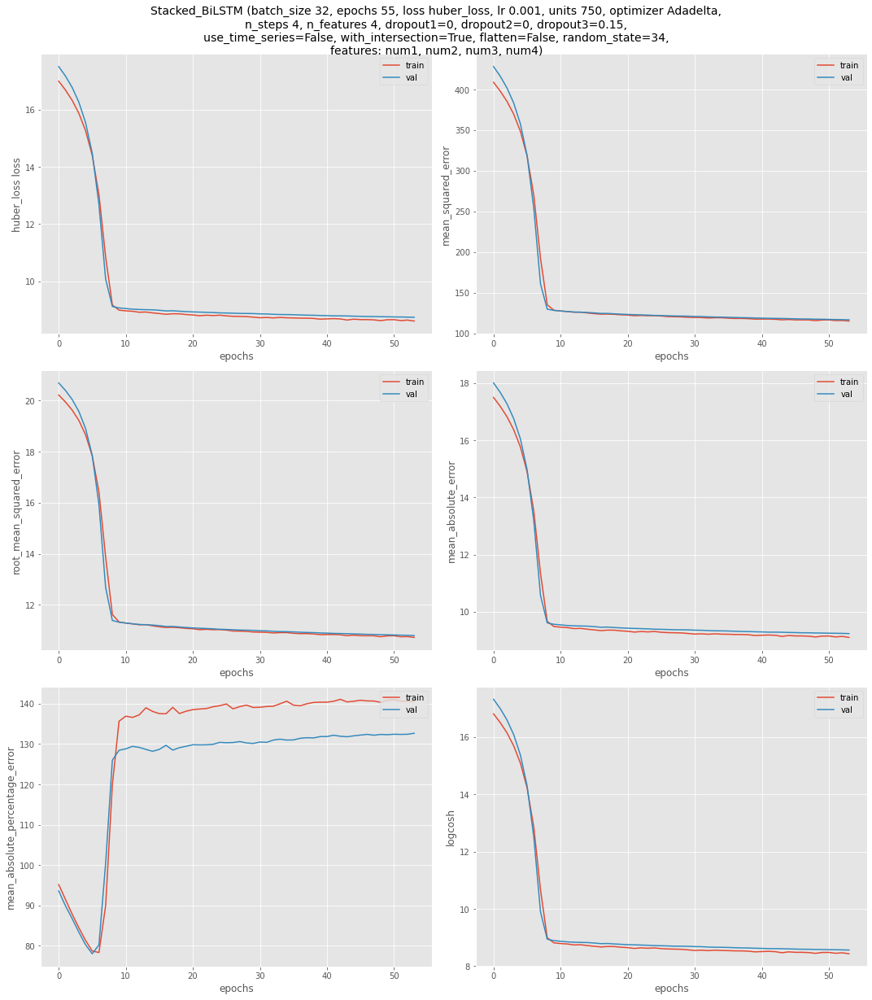

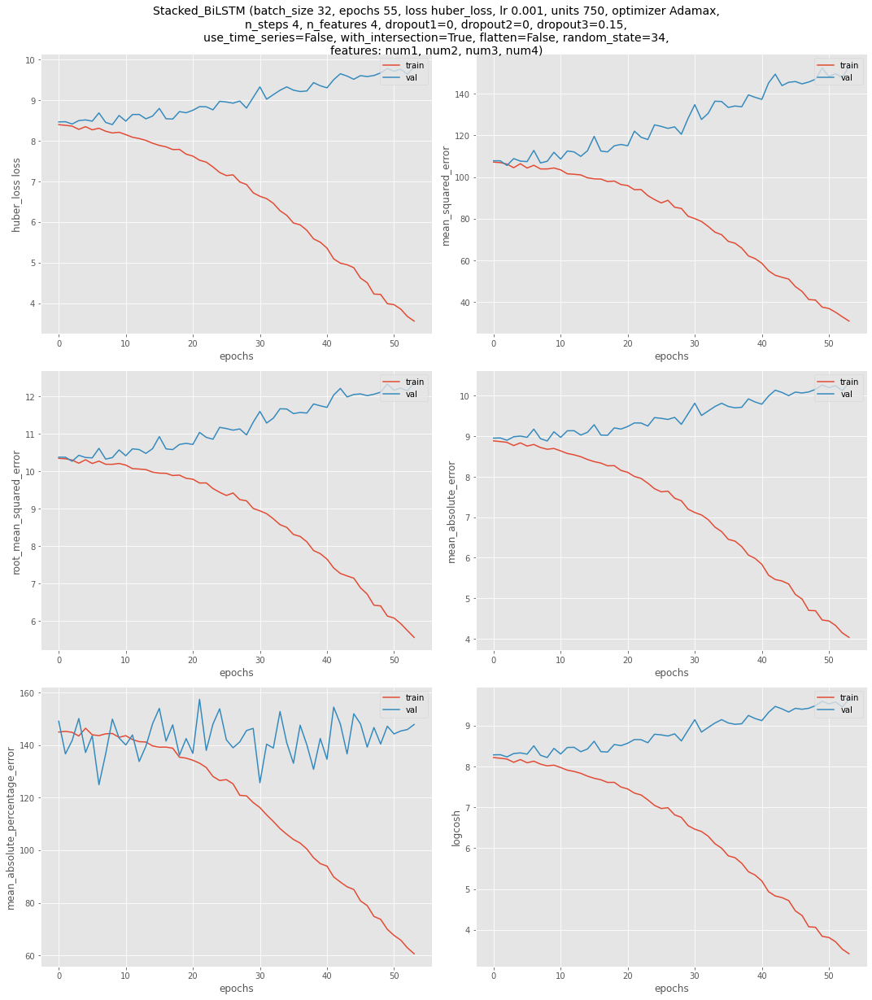

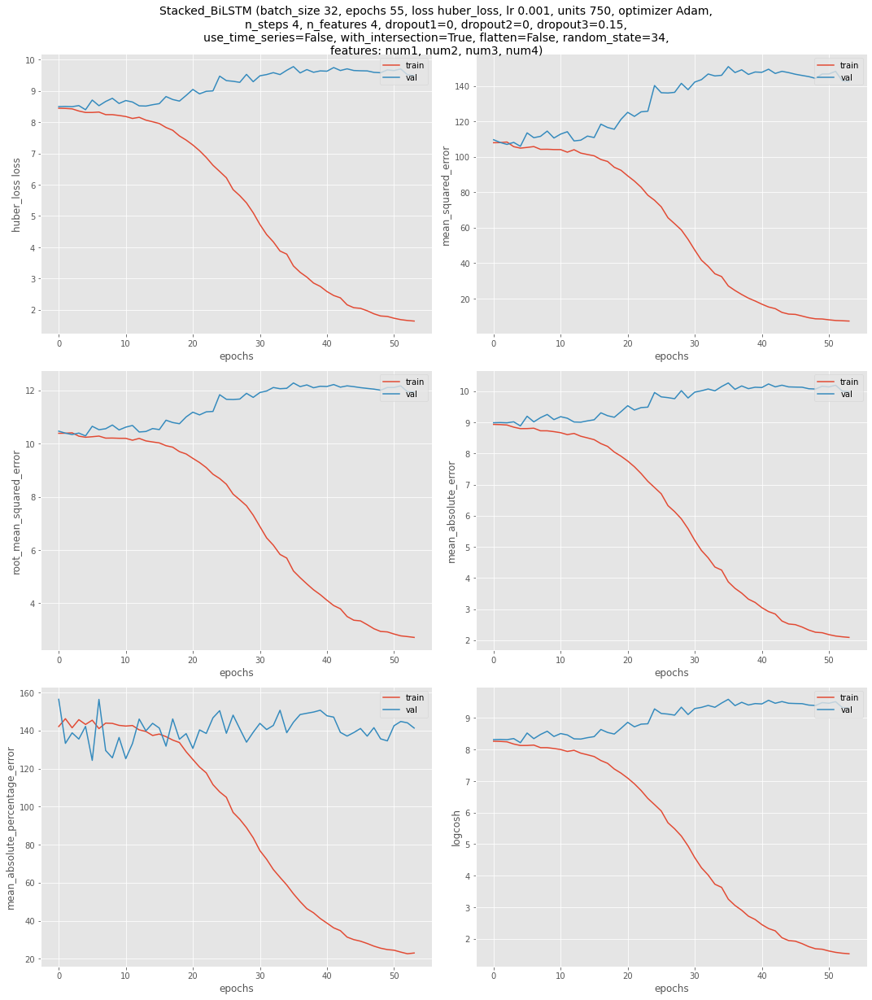

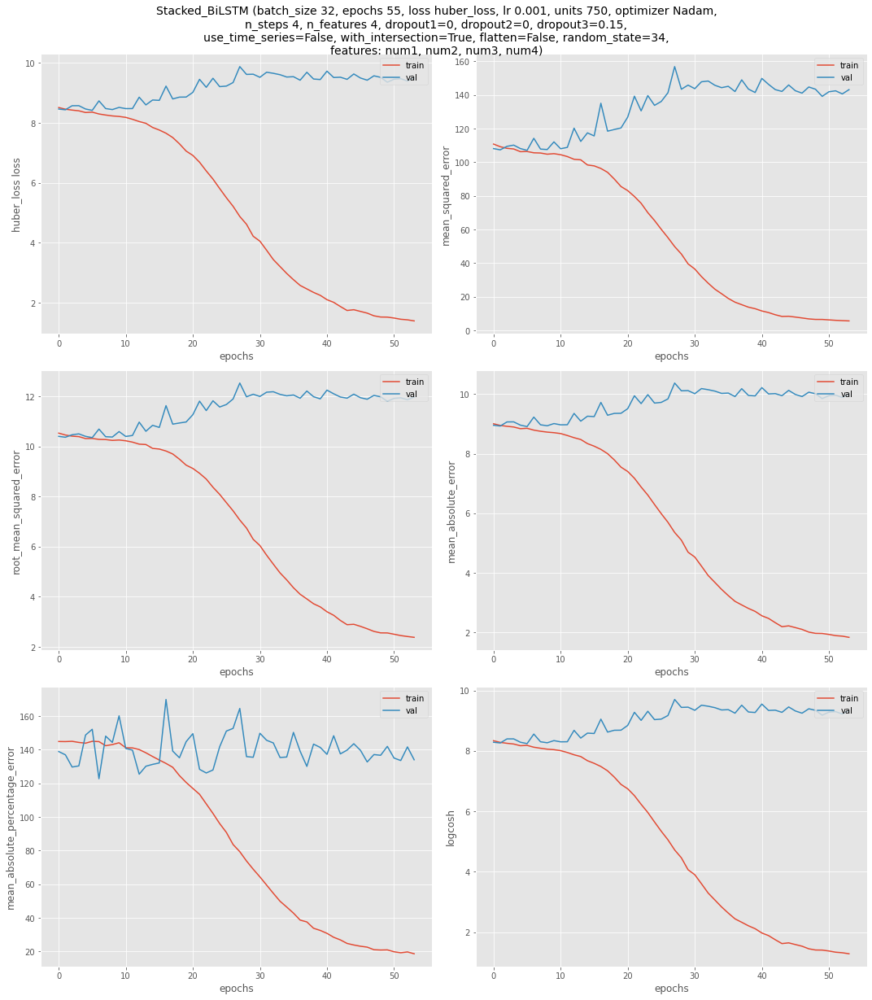

In [ ]:
# loss:        mse, mae, mape, msle, huber, logcosh
# optimizers: SGD, RMSprop, Adagrad, Adadelta, Adamax, Adam, Nadam, Ftrl
# metrics:    metric_mse, metric_rmse, metric_mae, metric_mape, metric_msle, metric_lcosh

for ts_flag in [ True, False ]:
    for loss_func in [ mse, mae, mape, msle, huber ]:
        for optim in [ SGD, RMSprop, Adagrad, Adadelta, Adamax, Adam, Nadam, Ftrl ]:

            # model parameters
            learning_rate = 0.001
            units         = 750
            dropout1      = 0
            dropout2      = 0
            dropout3      = 0.15
            loss          = loss_func
            optimizer     = optim
            use_lr_decay  = False
            metrics       = [ metric_mse, metric_rmse, metric_mae, metric_mape, metric_lcosh, ]

            # initiate model
            model_name = 'Stacked_BiLSTM'                                      # used further in plots
            model = stacked_BiLSTM( n_steps, n_features,
                                    learning_rate = learning_rate,
                                    units = units,
                                    dropout1 = dropout1,
                                    dropout2 = dropout2,
                                    dropout3 = dropout3,
                                    loss=loss,
                                    optimizer=optimizer,
                                    use_lr_decay=use_lr_decay,
                                    metrics=metrics,
                                  )

            # use unshuffled (time series) or shuffled data
            use_time_series = ts_flag
            if use_time_series:
                X_train, y_train = X, y
            else:
                X_train, y_train = X_sh, y_sh
            do_shuffle = not use_time_series                                   # shuffling while fitting

            # model fit paramaters
            batch_size = 32
            epochs     = 55
            verbose    = 0

            # decide if lr decay should be used
            if use_lr_decay:
                lrate = LearningRateScheduler(step_decay)
                callbacks = [lrate]
            else:
                callbacks = []
                
            # fit model
            history = model.fit( X_train, y_train,
                                 batch_size=batch_size,
                                 epochs=epochs,
                                 shuffle=do_shuffle,
                                 verbose=verbose,
                                 validation_split=0.2,
                                 callbacks=callbacks, )    #lr_decay, early_stopping

            # PLOT RESULTS (Note: ncols & nrows are constant values for all subplots)
            optimizer_name = model.optimizer.get_config()['name']
            loss_func_name = model.loss.get_config()['name']
            metric_names   = [ i.get_config()['name'] for i in model.metrics if i.get_config()['name'] != 'loss']
            features_list  = ', '.join(features)

            ncols = 3
            nrows = (len(metric_names) + 1) // ncols
            figure_width  = 15
            figure_height = nrows*0.75*(15/ncols) + 0.5
            plt.subplots(nrows, ncols, figsize=(figure_width, figure_height))
            joint_title = model_name + f' (batch_size {batch_size}, epochs {epochs}, loss {loss_func_name}, ' +\
                          f'lr {learning_rate}, units {units}, optimizer {optimizer_name},\nn_steps {n_steps}, ' +\
                          f'n_features {n_features}, dropout1={dropout1}, dropout2={dropout2}, dropout3={dropout3},\n' +\
                          f'use_time_series={use_time_series}, with_intersection={with_intersection}, ' +\
                          f'flatten={flatten}, random_state={random_state},\nfeatures: {features_list})'

            plt.suptitle( joint_title, fontsize=14 )

            # remove very large values in the beginning
            start_value = 1

            plt.subplot(nrows, ncols, 1)
            plt.plot(history.history['loss'][start_value:])
            plt.plot(history.history['val_loss'][start_value:])
            plt.ylabel(loss_func_name + ' loss')
            plt.xlabel('epochs')
            plt.legend(['train','val'], loc='upper right')
            #plt.show()

            for idx, metric_name in enumerate(metric_names):
                plt.subplot(nrows, ncols, idx+2)
                plt.plot(history.history[metric_name][start_value:])
                plt.plot(history.history['val_' + metric_name][start_value:])
                plt.ylabel(metric_name)
                plt.xlabel('epochs')
                plt.legend(['train','val'], loc='upper right')

            plt.tight_layout()

            # save figure
            if use_time_series:
                ts_indicator = '_TS_'
            else:
                ts_indicator = '_Shuffle_'
            timestr   = time.strftime('%Y%m%d-%H%M%S')
            folder    = './plots/All_LossFuncs_And_Optimizers/'
            file_name = folder + model_name + '_' + loss_func_name.capitalize() + '_' + optimizer_name + '_' + str(epochs) + '_Epochs' + ts_indicator + timestr + '.jpeg'
            plt.savefig(file_name)

            plt.show()

## Predict on last reserved data point and partial train set

In [ ]:
# predict
print('Predicting last reserved data point:')
print('True:     ', goldeny)
print('Predicted:', predict_one( model, goldenx ))

In [ ]:
# EVALUATE AND PREDICT ON TRAIN SET
def predict_on_trainset( model, X_, y_ ):
    
    for feature_set, target in zip( X_, y_ ):
        print('True:     ', target)
        print('Predicted:', predict_one( model, feature_set ), '\n', '='*28, sep='')
                
        
# evaluate
print('Evaluating on train set...')
score = model.evaluate( X_train, y_train, verbose=verbose )
print('\nTrain ' + loss_func_name.capitalize() + ':', score[0])
print('Train MSE:    ', score[1], '\n\n', '='*100, '\n', sep='')

# predict
m = 100
print(f'Predicting on last {m} rows of train set:\n')
predict_on_trainset( model, X_train[-m:], y_train[-m:] )

In [9]:
import gc
gc.collect()

23227

# Appendix

__OPTIMIZERS. IMPORTED TO BE CALLABLE ( Adam(lr=learning_rate) )__  
Using the code below does not make them callable. Each optimizer has also `**kwargs` as a parameter:
* `SGD = tf.keras.optimizers.SGD( learning_rate=0.01, momentum=0.0, nesterov=False, name="SGD" )    # old`
* `RMSprop = tf.keras.optimizers.RMSprop( learning_rate=0.001, rho=0.9, momentum=0.0, epsilon=1e-07, centered=False, name="RMSprop" )`
* `Adagrad = tf.keras.optimizers.Adagrad( learning_rate=0.001, initial_accumulator_value=0.1, epsilon=1e-07,name="Adagrad" )`
* `Adadelta = tf.keras.optimizers.Adadelta( learning_rate=0.001, rho=0.95, epsilon=1e-07, name="Adadelta" )`
* `Adamax = tf.keras.optimizers.Adamax( learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, name="Adamax" )`
* `Adam = tf.keras.optimizers.Adam( learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, amsgrad=False, name="Adam" )`
* `Nadam = tf.keras.optimizers.Nadam( learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, name="Nadam" )`
* `Ftrl = tf.keras.optimizers.Ftrl( learning_rate=0.001, learning_rate_power=-0.5, initial_accumulator_value=0.1, l1_regularization_strength=0.0, l2_regularization_strength=0.0, name="Ftrl", l2_shrinkage_regularization_strength=0.0 )`